<a href="https://colab.research.google.com/github/Miller76lite/GEOL558/blob/main/First_pass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Unsupervised Model:
###Methods used are KMeans, PCA, and Gaussian Mixture. KMeans score was used for scoring.
#Dataset:
###This dataset contains boreholes, depths, mineral compounds, and ICP data of various rare earth elements (REE) found in the Thaba Mine in the Bushveld Complex.
#Purpose:
###To determine if the unsupervised models can identify any unique trends or clusters in the borehole data.

Import the required libraries, import and scale the dataset.

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
Thaba = pd.read_csv('https://raw.githubusercontent.com/Miller76lite/GEOL558/main/DataSet_Thaba_Classification.csv')

In [19]:

# Check for missing values before imputation
print("Missing values before imputation:\n", Thaba.isnull().sum())
# Select numerical features
numerical_features = Thaba.select_dtypes(include=np.number).columns
Thaba_numerical = Thaba[numerical_features]

# Handle missing values by imputing with the mean
imputer = SimpleImputer(strategy='mean')
Thaba_imputed = imputer.fit_transform(Thaba_numerical)

# Data preprocessing (e.g., standardization)
scaler = StandardScaler()
Thaba_scaled = scaler.fit_transform(Thaba_imputed)

# Check for missing values after imputation
Thaba_imputed_df = pd.DataFrame(Thaba_imputed, columns=numerical_features)  # Convert to DataFrame
print("Missing values after imputation:\n", Thaba_imputed_df.isnull().sum())

Missing values before imputation:
 ProjectCode      0
BH_ID            0
Motherhole       0
HoleType         0
MaxDepth         0
DepthFrom        0
DepthTo          0
Date             0
Cr2O3_%         79
FeO_%           80
SiO2_%          79
MgO_%           79
Al2O3_%         80
CaO_%           79
P_%             80
Au_ICP_ppm       0
Pt_ICP_ppm       0
Pd_ICP_ppm       0
Rh_ICP_ppm       0
Ir_ICP_ppm       0
Ru_ICP_ppm       0
Stratigraphy     0
Filter           0
gmm_cluster      0
dtype: int64
Missing values after imputation:
 MaxDepth       0
DepthFrom      0
DepthTo        0
Cr2O3_%        0
FeO_%          0
SiO2_%         0
MgO_%          0
Al2O3_%        0
CaO_%          0
P_%            0
Au_ICP_ppm     0
Pt_ICP_ppm     0
Pd_ICP_ppm     0
Rh_ICP_ppm     0
Ir_ICP_ppm     0
Ru_ICP_ppm     0
Filter         0
gmm_cluster    0
dtype: int64


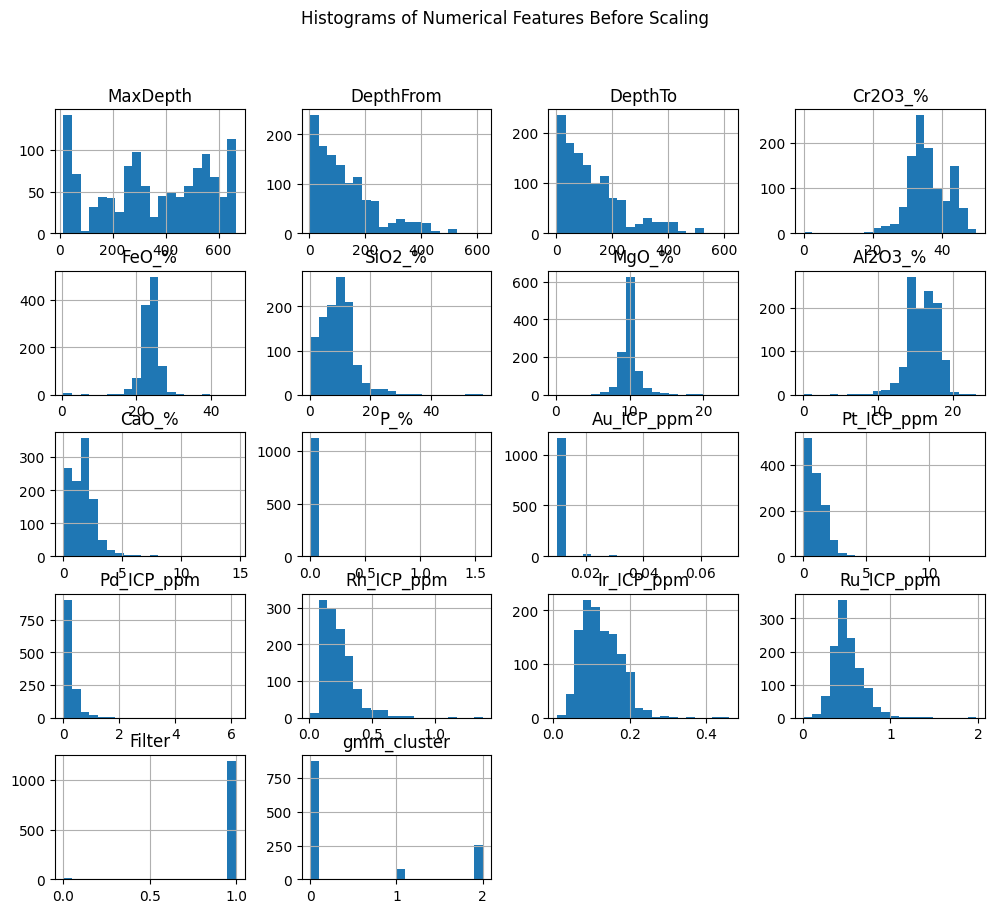

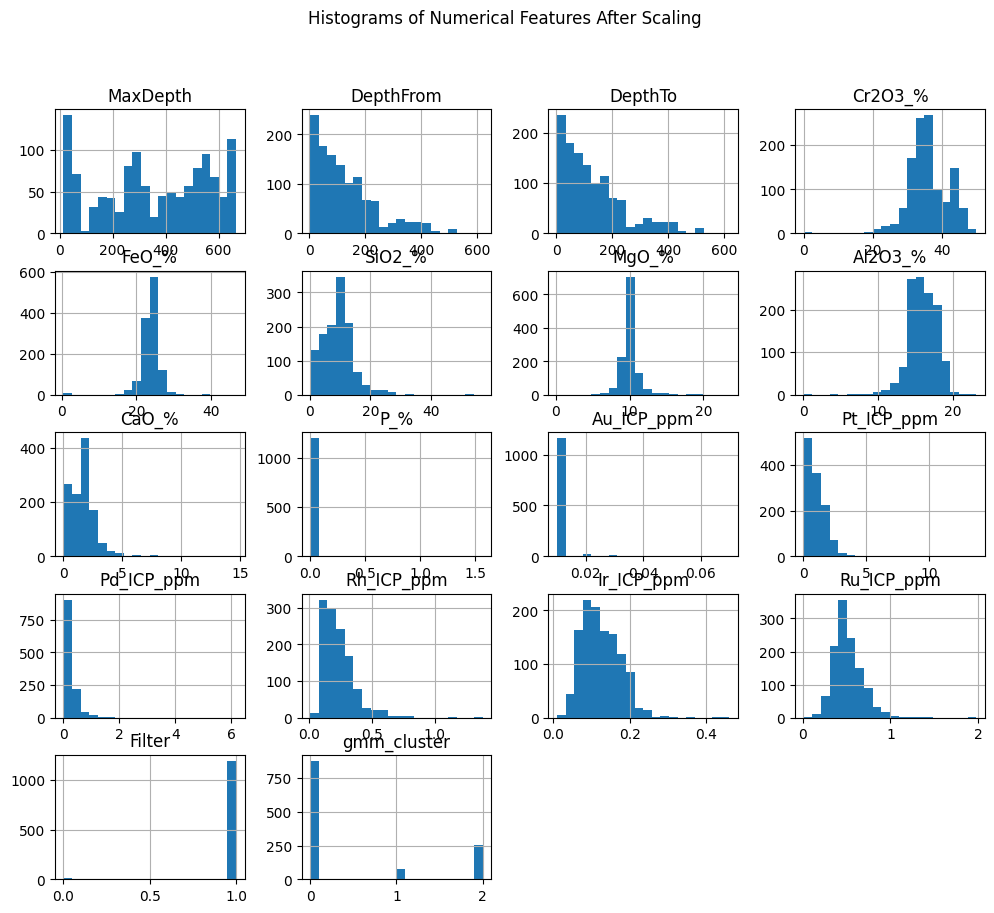

In [20]:
# Plot histograms before scaling
Thaba[numerical_features].hist(bins=20, figsize=(12, 10))
plt.suptitle("Histograms of Numerical Features Before Scaling")
plt.show()

# Plot histograms after scaling (using Thaba_imputed_df from step 1)
Thaba_imputed_df.hist(bins=20, figsize=(12, 10))
plt.suptitle("Histograms of Numerical Features After Scaling")
plt.show()

In [6]:
pd.DataFrame(Thaba_scaled, columns=numerical_features).describe()

,MaxDepth,DepthFrom,DepthTo,Cr2O3_%,FeO_%,SiO2_%,MgO_%,Al2O3_%,CaO_%,P_%,Au_ICP_ppm,Pt_ICP_ppm,Pd_ICP_ppm,Rh_ICP_ppm,Ir_ICP_ppm,Ru_ICP_ppm,Filter
count,1205.000000,1.205000e+03,1205.000000,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1205.000000,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03
mean,0.000000,-9.434592e-17,0.000000,-9.434592e-17,8.844930e-17,0.000000e+00,-2.358648e-16,0.000000,-2.358648e-17,-1.326740e-17,3.589568e-16,9.434592e-17,-8.255268e-17,-2.122783e-16,2.594513e-16,-3.184175e-16,-3.125209e-16
std,1.000415,1.000415e+00,1.000415,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00
min,-1.648690,-1.156446e+00,-1.159742,-6.135224e+00,-7.895077e+00,-1.702032e+00,-6.344880e+00,-8.080722,-1.361393e+00,-6.369737e-02,-1.629595e-01,-1.150228e+00,-8.058140e-01,-1.741505e+00,-2.225610e+00,-2.929429e+00,-9.970791e+00
25%,-0.802837,-8.030882e-01,-0.802781,-5.460220e-01,-3.092906e-01,-6.859111e-01,-3.662772e-01,-0.607718,-6.708442e-01,-6.369737e-02,-1.629595e-01,-7.319540e-01,-4.694343e-01,-7.398646e-01,-8.574138e-01,-6.173531e-01,1.002929e-01
50%,0.002983,-2.458107e-01,-0.244967,-4.958446e-02,0.000000e+00,3.234756e-16,-8.612964e-02,0.000000,-1.803912e-16,-6.369737e-02,-1.629595e-01,-1.441092e-01,-2.553745e-01,-2.005199e-01,-7.558737e-02,-1.549379e-01,1.002929e-01
75%,0.903776,4.471692e-01,0.446902,6.146147e-01,4.245996e-01,4.704276e-01,1.685499e-01,0.712546,3.609163e-01,-6.369737e-02,-1.629595e-01,4.437355e-01,1.421651e-01,4.929234e-01,7.062391e-01,5.386849e-01,1.002929e-01
max,1.505661,4.488026e+00,4.479985,2.405213e+00,7.783794e+00,8.646743e+00,8.534774e+00,3.653831,1.050792e+01,3.434165e+01,1.403219e+01,1.431461e+01,1.803145e+01,8.814242e+00,6.569938e+00,8.457546e+00,1.002929e-01


In [7]:
Thaba.describe()

,MaxDepth,DepthFrom,DepthTo,Cr2O3_%,FeO_%,SiO2_%,MgO_%,Al2O3_%,CaO_%,P_%,Au_ICP_ppm,Pt_ICP_ppm,Pd_ICP_ppm,Rh_ICP_ppm,Ir_ICP_ppm,Ru_ICP_ppm,Filter
count,1205.000000,1205.000000,1205.000000,1126.000000,1125.000000,1126.000000,1126.000000,1125.000000,1126.000000,1125.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000
mean,354.993793,129.194871,129.770896,35.849654,23.744524,9.496661,10.135275,15.922178,1.705746,0.002907,0.010689,1.057477,0.273510,0.236025,0.123867,0.516805,0.990041
std,206.670294,109.254857,109.329033,6.045757,3.061533,5.683370,1.625486,2.031183,1.273920,0.047248,0.004229,0.884955,0.327147,0.129841,0.051183,0.173077,0.099335
min,14.400000,2.900000,3.030000,0.010000,0.400000,0.150000,0.170000,0.070000,0.030000,0.000000,0.010000,0.040000,0.010000,0.010000,0.010000,0.010000,0.000000
25%,189.140000,41.490000,42.040000,32.350000,22.720000,5.347500,9.500000,14.680000,0.810000,0.000000,0.010000,0.410000,0.120000,0.140000,0.080000,0.410000,1.000000
50%,355.610000,102.350000,103.000000,35.065000,23.930000,9.495000,9.940000,16.040000,1.660000,0.000000,0.010000,0.930000,0.190000,0.210000,0.120000,0.490000,1.000000
75%,541.700000,178.030000,178.610000,39.980000,25.110000,12.320000,10.430000,17.400000,2.220000,0.000000,0.010000,1.450000,0.320000,0.300000,0.160000,0.610000,1.000000
max,666.040000,619.330000,619.360000,49.900000,46.760000,56.980000,23.540000,23.090000,14.640000,1.570000,0.070000,13.720000,6.170000,1.380000,0.460000,1.980000,1.000000


In [9]:
Thaba.shape

(1205, 23)

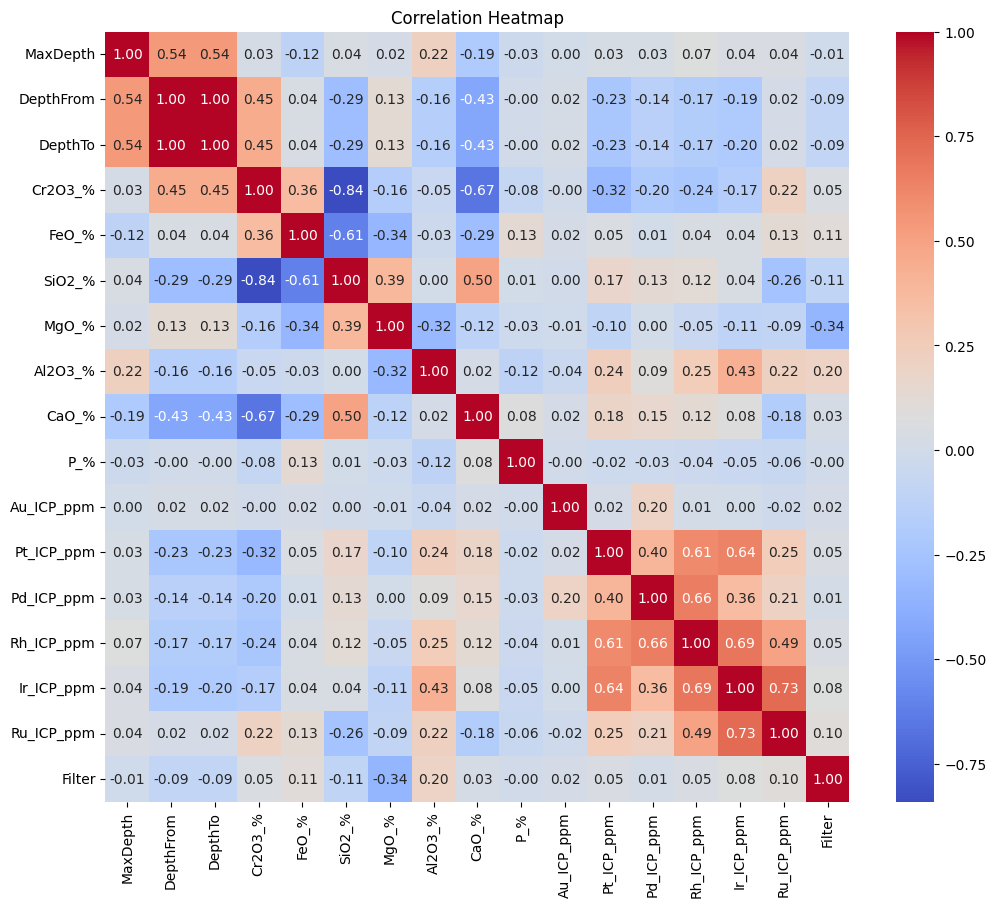

In [12]:
# Calculate the correlation matrix, include only numerical features
correlation_matrix = Thaba.corr(numeric_only=True)

# Create a heatmap
plt.figure(figsize=(12, 10))  # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

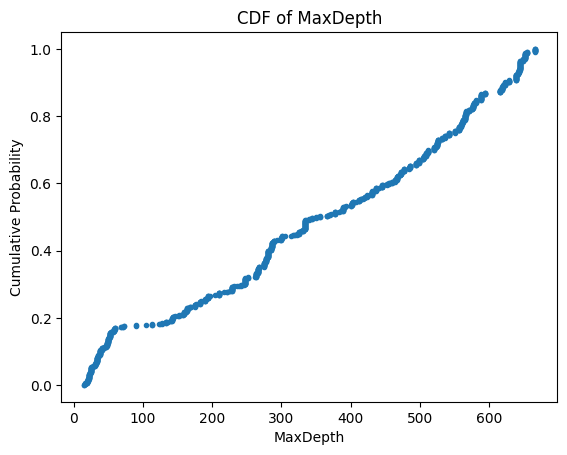

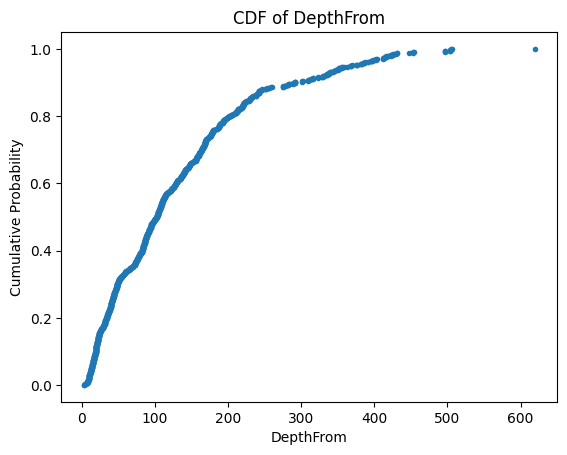

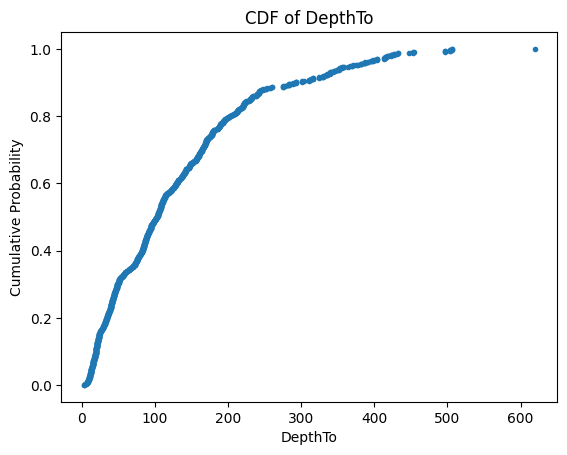

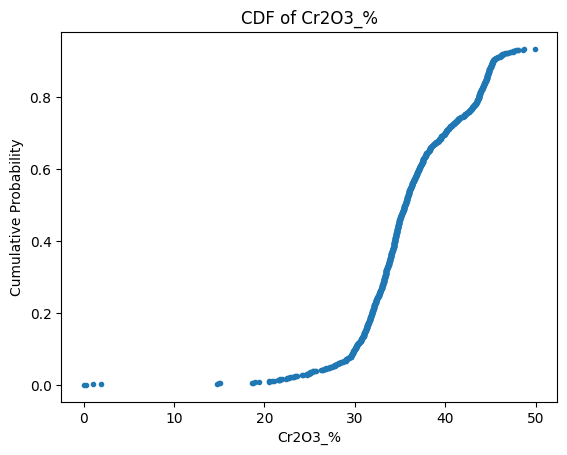

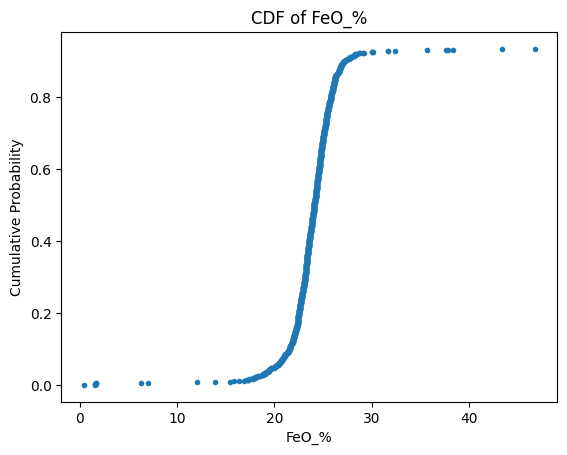

...

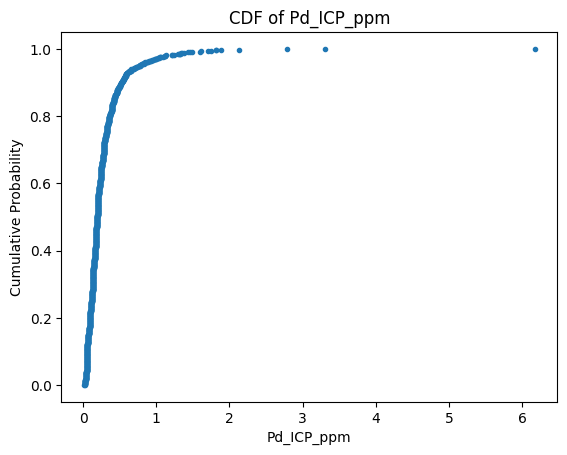

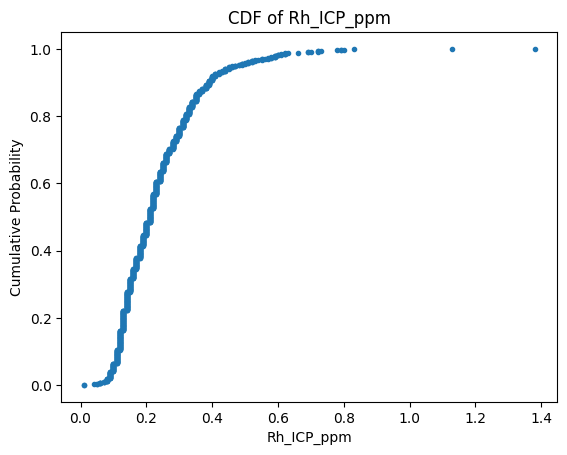

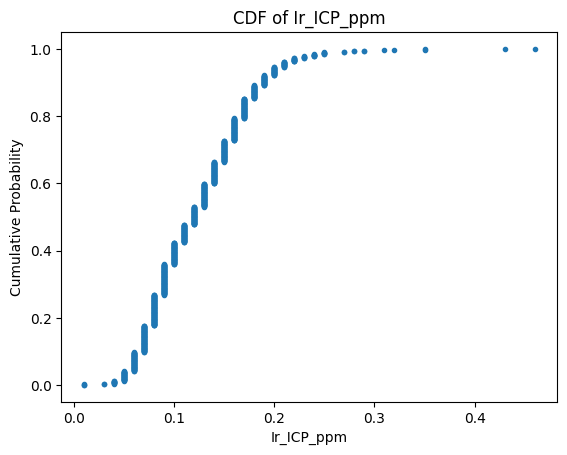

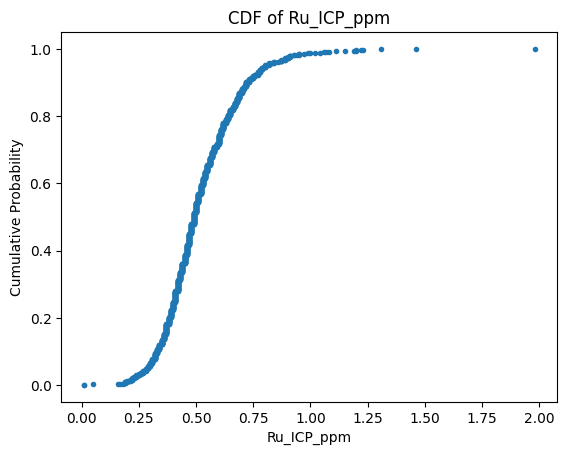

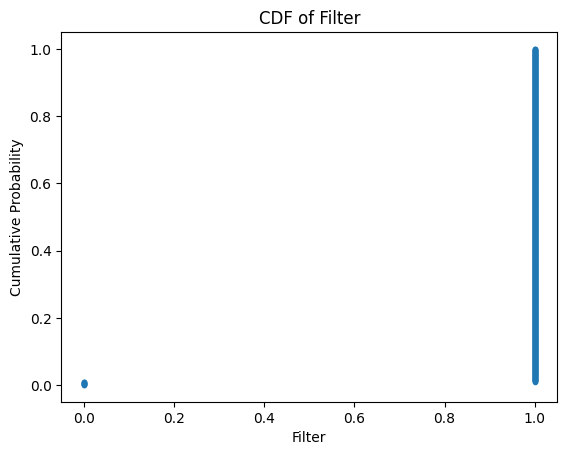

In [16]:
# Get numerical features
numerical_features = Thaba.select_dtypes(include=np.number).columns

# Iterate through numerical features and plot CDFs
for feature in numerical_features:
    x = np.sort(Thaba[feature])
    y = np.arange(1, len(x) + 1) / len(x)

    plt.plot(x, y, marker='.', linestyle='none')
    plt.xlabel(feature)
    plt.ylabel('Cumulative Probability')
    plt.title(f'CDF of {feature}')
    plt.show()

In [15]:
# Calculate and display the percentage of missing values for each feature
missing_percentage = Thaba.isnull().sum() / len(Thaba) * 100
print("Percentage of missing values:\n", missing_percentage)

Percentage of missing values:
 ProjectCode     0.000000
BH_ID           0.000000
Motherhole      0.000000
HoleType        0.000000
MaxDepth        0.000000
DepthFrom       0.000000
DepthTo         0.000000
Date            0.000000
Cr2O3_%         6.556017
FeO_%           6.639004
SiO2_%          6.556017
MgO_%           6.556017
Al2O3_%         6.639004
CaO_%           6.556017
P_%             6.639004
Au_ICP_ppm      0.000000
Pt_ICP_ppm      0.000000
Pd_ICP_ppm      0.000000
Rh_ICP_ppm      0.000000
Ir_ICP_ppm      0.000000
Ru_ICP_ppm      0.000000
Stratigraphy    0.000000
Filter          0.000000
dtype: float64


In [ ]:
numerical_features = Thaba.select_dtypes(include=np.number).columns
print(numerical_features)

Index(['MaxDepth', 'DepthFrom', 'DepthTo', 'Cr2O3_%', 'FeO_%', 'SiO2_%',
       'MgO_%', 'Al2O3_%', 'CaO_%', 'P_%', 'Au_ICP_ppm', 'Pt_ICP_ppm',
       'Pd_ICP_ppm', 'Rh_ICP_ppm', 'Ir_ICP_ppm', 'Ru_ICP_ppm', 'Filter'],
      dtype='object')


#KMeans:
###Below is the KMeans clustering using the elbow method to identify the optimal number of clusters for the data. This is accompanied by a pair plot of the Thaba dataset to visualize clusters in each section.

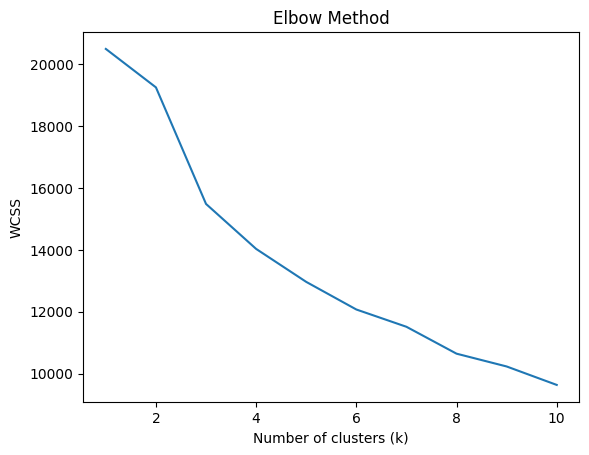

In [ ]:
# Apply KMeans Clustering
kmeans = KMeans(n_clusters=3)  # Adjust the number of clusters as needed
kmeans_labels = kmeans.fit_predict(Thaba_scaled)

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(Thaba_scaled)  # Replace Thaba_scaled with your data
    wcss.append(kmeans.inertia_)  # Inertia is WCSS

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()


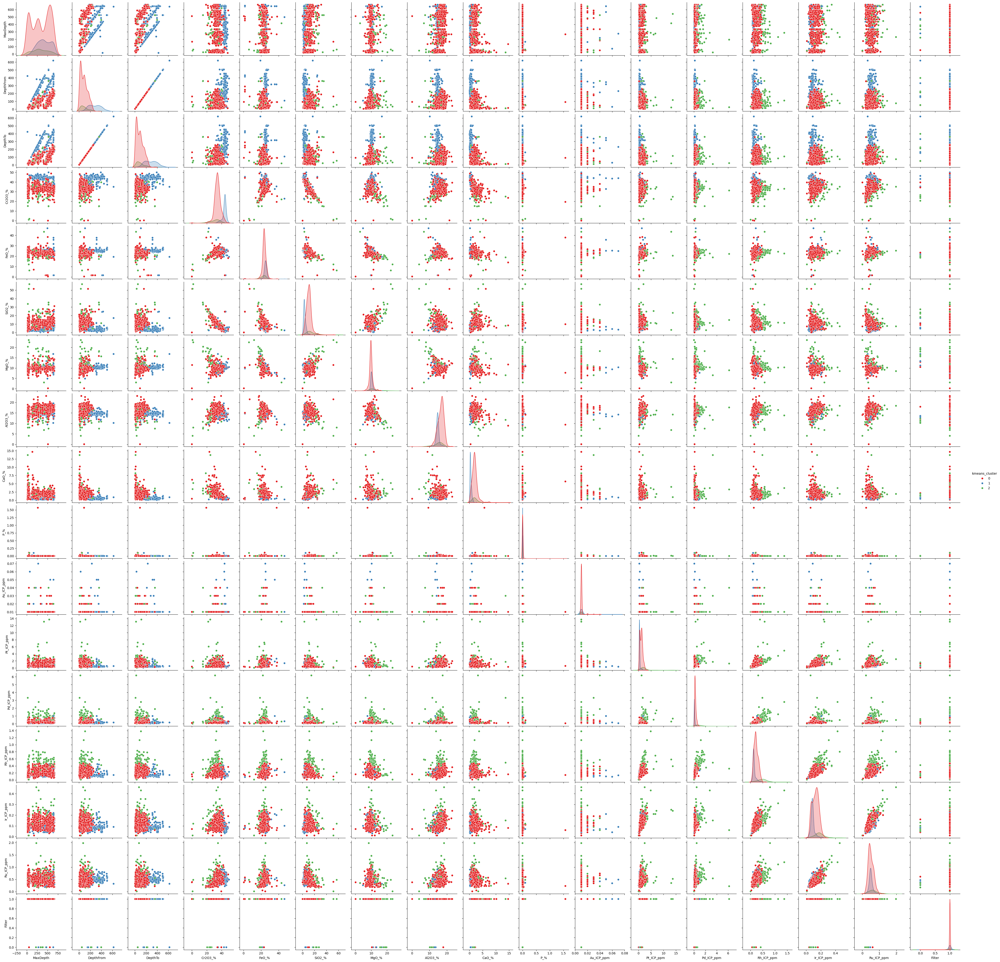

In [ ]:
# Assuming 'kmeans_labels' contains your cluster assignments and 'Thaba' is your DataFrame
Thaba['kmeans_cluster'] = kmeans_labels  # Add cluster labels to your DataFrame

# Create the pair plot
sns.pairplot(Thaba, hue='kmeans_cluster', vars=numerical_features, palette='Set1')
plt.show()

In [ ]:
score = kmeans.score(Thaba_scaled)
print(f"KMeans score: {score}")

KMeans score: -16148.678360340495


#PCA:
###PCA is used to visualize the clusters identified by KMeans in a lower-dimensional space. By plotting the data points along the first few principal components, cluster separation and potential patterns can be observed.

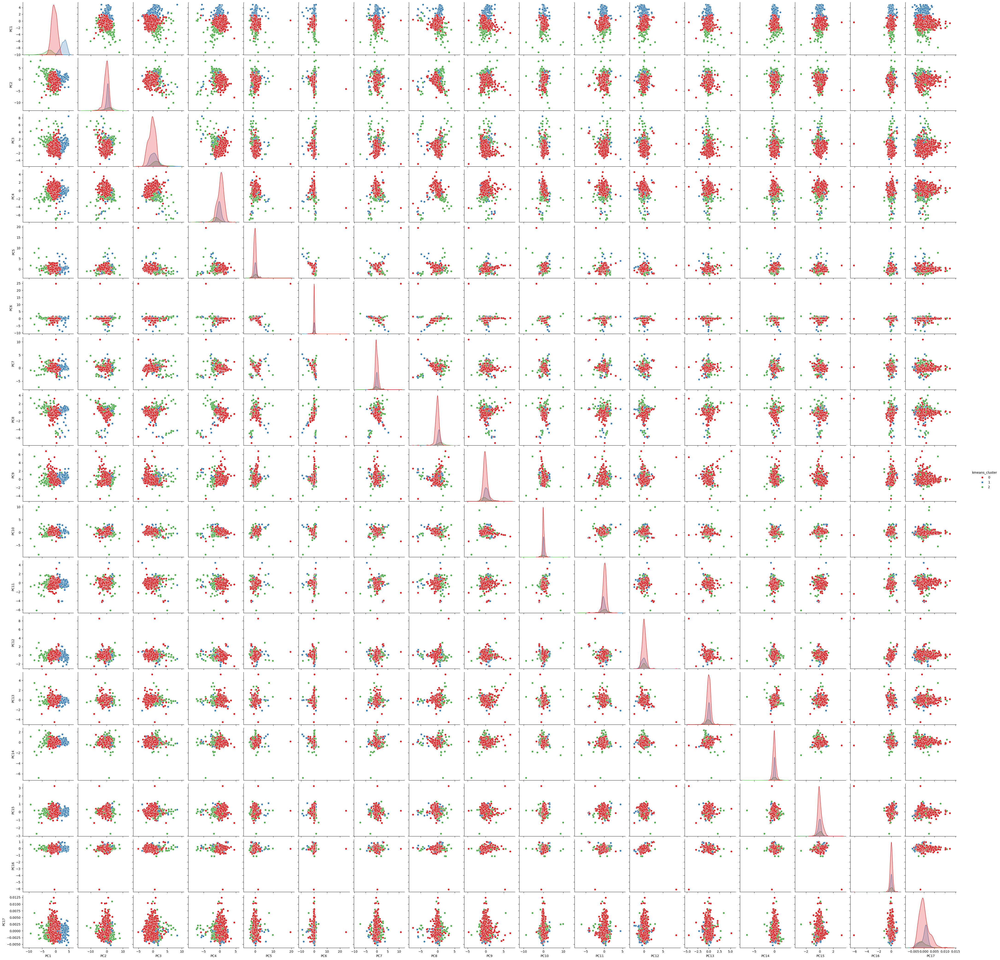

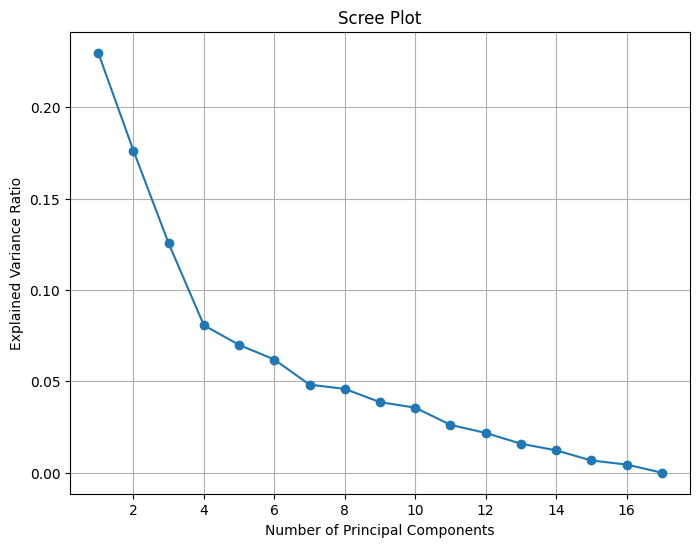

In [ ]:
# Assuming your data is in a pandas DataFrame called 'Thaba' and you have 'Thaba_scaled' from previous steps
# Select numerical features for PCA, excluding 'kmeans_cluster'
numerical_features = Thaba.select_dtypes(include=np.number).columns
numerical_features = numerical_features[numerical_features != 'kmeans_cluster']  # Exclude 'kmeans_cluster'

# Impute missing values again for the selected numerical features
imputer = SimpleImputer(strategy='mean')  # Create a new imputer instance if needed
Thaba_imputed_for_pca = imputer.fit_transform(Thaba[numerical_features])

# Data preprocessing (e.g., standardization)
scaler = StandardScaler()
Thaba_scaled_for_pca = scaler.fit_transform(Thaba_imputed_for_pca)


# Apply PCA
pca = PCA()  # You can specify the number of components with n_components
pca_result = pca.fit_transform(Thaba_scaled_for_pca)  # Use the modified scaled data

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_


# Assuming 'pca_result' contains the PCA transformed data and 'Thaba' is your original DataFrame
# Create a DataFrame with the principal components
pca_df = pd.DataFrame(data=pca_result, columns=[f'PC{i+1}' for i in range(pca_result.shape[1])])

# Add the 'kmeans_cluster' column to the PCA DataFrame for coloring
pca_df['kmeans_cluster'] = Thaba['kmeans_cluster']  # Assuming 'kmeans_cluster' is in your original DataFrame

# Scree plot (explained variance vs. number of components)
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.grid()
plt.show()
# Create the pair plot for the principal components, colored by kmeans clusters
sns.pairplot(pca_df, hue='kmeans_cluster', vars=[f'PC{i+1}' for i in range(pca_result.shape[1])], palette='Set1')
plt.show()



#Gaussian Mixture Model:
###GMM is applied to the dataset to identify clusters. Visualizing the clusters using a pair plot provides insights into the underlying data structure and reveals potential distinct groups within the borehole data. identifies any distinct groups within the borehole data.

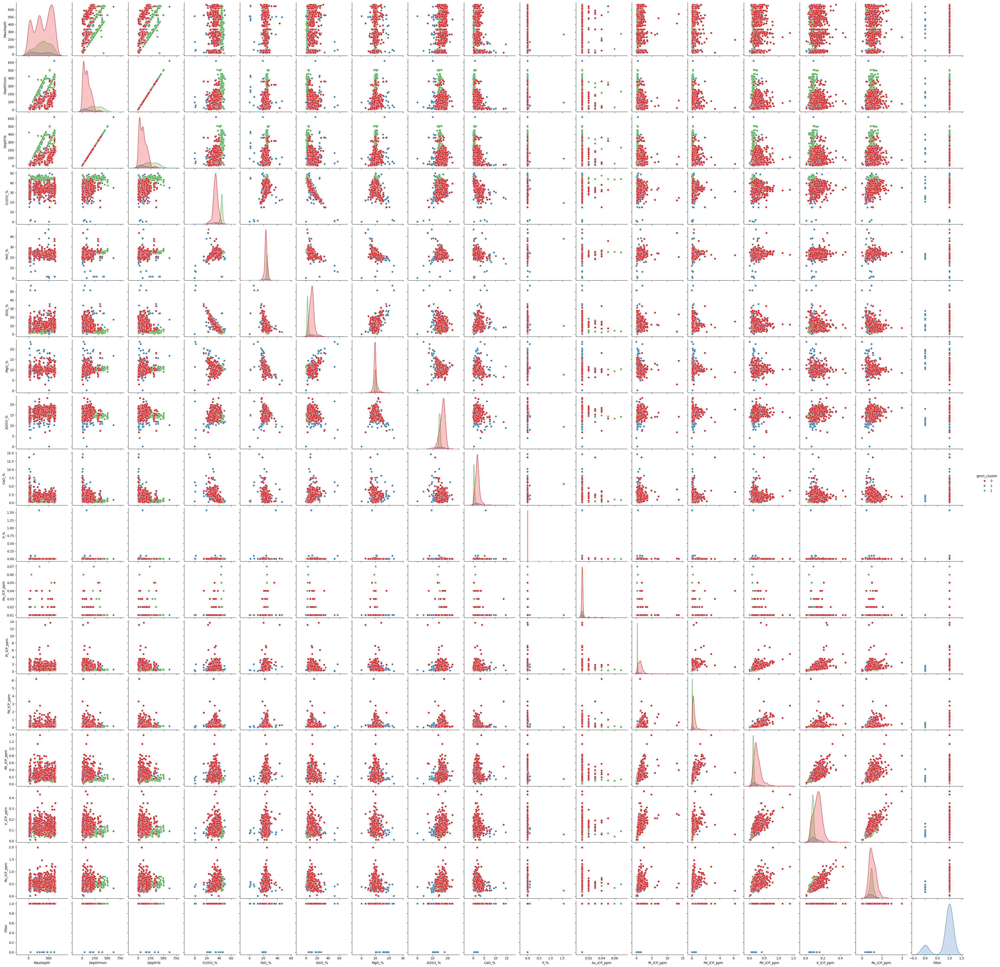

In [17]:
# Apply Gaussian Mixture Model
gmm = GaussianMixture(n_components= 3, random_state=42)  # Adjust n_components as needed
gmm_labels = gmm.fit_predict(Thaba_scaled)

# Add the cluster labels to your DataFrame
Thaba['gmm_cluster'] = gmm_labels

# Visualize the clusters (pair plot)
sns.pairplot(Thaba, hue='gmm_cluster', vars=numerical_features, palette='Set1')
plt.show()



#Discussion Questions:

##Which method did you like the most?
###My preferred method was PCA because it provided a simplified view compared to KMeans, which helps visualize the data.

##Which method did you like the least?
###I didn't have a method I disliked; however, until I discovered the elbow method, testing various cluster quantities wasn't very efficient.

## How did you score these unsupervised models?
### I scored some of these models using the KMeans score

##Did the output align with your geologic understanding?
### The output for some of the graphs, such as those showing "depth from" and various concentrations, aligned with my geological understanding.



##What did you want to learn more about?
### I would like to look into each of the methods used more and see if there are any other methods that would better suit thois data set. I arbitrarily chose three from the list in the assignment to work with.

##Did you pre-process your data?
###Yes, the data was preprocessed by pulling only the numerical data and then scaling then for use in the KMeans method.

##What was a decision you were most unsure about?
###Due to my limited domain knowledge, choosing appropriate models for this dataset was challenging. Therefore, I randomly selected a few from the list to explore and analyze.